In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer
from sklearn.ensemble import HistGradientBoostingRegressor as hgbr
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import r2_score as r2 
from sklearn.decomposition import PCA
import shap

c:\Users\Steven\Desktop\school github repos\svo-directed-practicum\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Open the pickle file
df = pickle.load(open('../../data/processed/merged_data_202507062100.pkl', 'rb'))
df

,AAL_Article Count,AAL_Article Count_cum04,AAL_Article Count_cum08,AAL_Article Count_cum16,AAL_Article Count_cum48,AAL_Article Count_cum96,AAL_Change_Article Count,AAL_Change_Article Count_cum04,AAL_Change_Article Count_cum08,AAL_Change_Article Count_cum16,AAL_Change_Article Count_cum16_lag01,AAL_Change_Article Count_cum16_lag02,AAL_Change_Article Count_cum16_lag03,AAL_Change_Article Count_cum16_lag04,AAL_Change_Article Count_cum16_lag05,AAL_Change_Article Count_cum16_lag06,AAL_Change_Article Count_cum16_lag07,AAL_Change_Article Count_cum16_lag08,AAL_Change_Article Count_cum16_lag09,AAL_Change_Article Count_cum16_lag10,AAL_Change_Article Count_cum16_lag11,AAL_Change_Article Count_cum16_lag12,AAL_Change_Article Count_cum16_lag13,AAL_Change_Article Count_cum16_lag14,AAL_Change_Article Count_cum16_lag15,AAL_Change_Article Count_cum16_lag16,AAL_Change_Article Count_cum16_lag17,AAL_Change_Article Count_cum16_lag18,AAL_Change_Article Count_cum16_lag19,AAL_Change_Article Count_cum16_lag20,AAL_Change_Article Count_cum16_lag21,AAL_Change_Article Count_cum16_lag22,AAL_Change_Article Count_cum16_lag23,AAL_Change_Article Count_cum16_lag24,AAL_Change_Article Count_cum16_lag25,AAL_Change_Article Count_cum16_lag26,AAL_Change_Article Count_cum48,AAL_Change_Article Count_cum96,AAL_Change_Article Count_lag01,AAL_Change_Article Count_lag02,...,general_PCA_Word_3_cum96,general_PCA_Word_4,general_PCA_Word_4_cum04,general_PCA_Word_4_cum08,general_PCA_Word_4_cum16,general_PCA_Word_4_cum48,general_PCA_Word_4_cum96,general_Tone,general_Tone_cum04,general_Tone_cum08,general_Tone_cum16,general_Tone_cum48,general_Tone_cum96,general_llm_sentiment,general_llm_sentiment_cum04,general_llm_sentiment_cum08,general_llm_sentiment_cum16,general_llm_sentiment_cum48,general_llm_sentiment_cum96,hour_of_day_10,hour_of_day_11,hour_of_day_12,hour_of_day_13,hour_of_day_14,hour_of_day_15,hour_of_day_9,is_close,is_open,month_of_year_1,month_of_year_10,month_of_year_11,month_of_year_12,month_of_year_2,month_of_year_3,month_of_year_4,month_of_year_5,month_of_year_6,month_of_year_7,month_of_year_8,month_of_year_9
2018-01-03 09:45:00,8,12,17,32,68,146,6,8,7,7,2,5,-3,2,1,1,1,0,2,3,-2,2,0,2,-2,0,0,2,2,-1,1,0,0,0,1,0,7,8,1,1,...,-4482.468666,982.514091,1545.375182,2260.869430,4077.206392,8734.944803,18546.649259,5.841900,-33.695335,-42.885681,-74.346504,-632.382324,-889.304383,8.915320,8.230512,17.404274,20.348570,-66.058998,-29.859108,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:00:00,0,11,14,31,68,145,-8,-1,-3,-1,7,2,5,-3,2,1,1,1,0,2,3,-2,2,0,2,-2,0,0,2,2,-1,1,0,0,0,1,0,-1,6,1,...,-4600.938559,218.087833,1483.656840,2337.884253,4188.627904,8641.251081,18536.531427,-22.772053,-55.828072,-66.317001,-96.032883,-560.655334,-916.753659,-1.825943,3.069341,15.400552,17.023170,-48.272476,-32.752705,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:15:00,0,10,14,29,65,145,0,-1,0,-2,-1,7,2,5,-3,2,1,1,1,0,2,3,-2,2,0,2,-2,0,0,2,2,-1,1,0,0,0,-3,0,-8,6,...,-4561.750208,229.381321,1466.181750,2567.265575,4131.553677,8729.558699,18765.912749,-0.452452,-20.124540,-66.769455,-88.071068,-536.578735,-917.206110,0.545077,6.510797,15.945629,17.261574,-43.017365,-32.207630,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:30:00,3,11,15,32,65,148,3,1,1,3,-2,-1,7,2,5,-3,2,1,1,1,0,2,3,-2,2,0,2,-2,0,0,2,2,-1,1,0,0,0,3,0,-8,...,-4736.250232,628.783994,2058.767240,2784.711048,4760.337671,8910.422026,19291.498649,0.129244,-17.253361,-62.584270,-87.941826,-499.356018,-913.670971,4.601380,12.235835,14.539044,21.862953,-33.829987,-28.934919,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2018-01-03 10:45:00,2,5,17,32,63,150,-1,-6,2,0,3,-2,-1,7,2,5,-3,2,1,1,1,0,2,3,-2,2,0,2,-2,0,0,2,2,-1,1,0,-2,2,3,0,...,-4626.053499,558.940510,1635.193659,3180.568840,5282.118357,9253.781342,19639.056100,-3.638763,-26.734024,-60.429359,-84.708809,-473.549744,-910.545466,1.710028,5.030543,13.261055,23.913515,-28.738859,-26.751976,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,

In [3]:
# Make cumulative explained variance plots for each PCA fit
def plot_cumulative_explained_variance(pca_fit, title):
    plt.figure(figsize=(10, 6))
    plt.plot(np.cumsum(pca_fit.explained_variance_ratio_), marker='o')
    plt.title(title)
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.grid()
    plt.show()

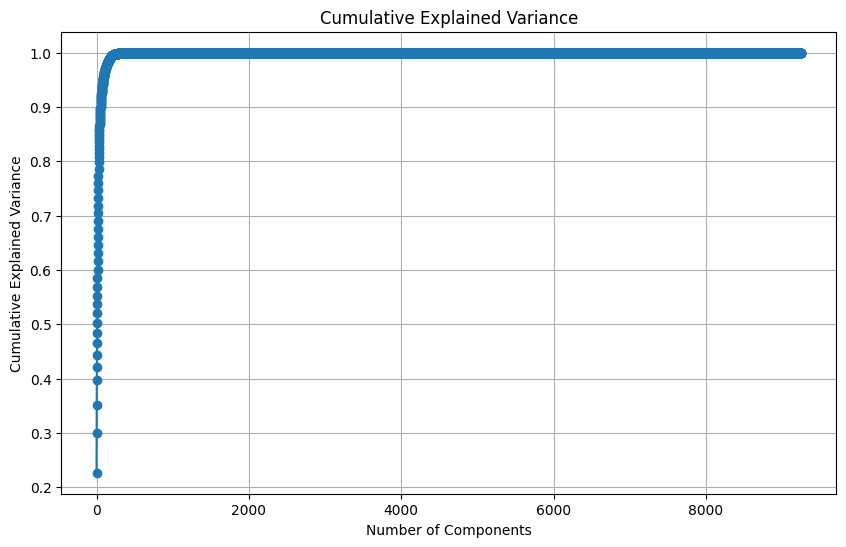

In [9]:
pca_fit = PCA().fit(df[[i for i in df.columns if 'lag'in i]])
plot_cumulative_explained_variance(pca_fit, 'Cumulative Explained Variance')

In [7]:
pd.DataFrame(np.cumsum(pca_fit.explained_variance_ratio_))

,0
0,0.246201
1,0.319219
2,0.369107
3,0.415761
4,0.439923
...,...
11547,1.000000
11548,1.000000
11549,1.000000
11550,1.000000


In [8]:
df.columns.tolist()

['AAL_Article Count',
 'AAL_Article Count_cum04',
 'AAL_Article Count_cum08',
 'AAL_Article Count_cum16',
 'AAL_Article Count_cum48',
 'AAL_Article Count_cum96',
 'AAL_Change_Article Count',
 'AAL_Change_Article Count_cum04',
 'AAL_Change_Article Count_cum08',
 'AAL_Change_Article Count_cum16',
 'AAL_Change_Article Count_cum16_lag01',
 'AAL_Change_Article Count_cum16_lag02',
 'AAL_Change_Article Count_cum16_lag03',
 'AAL_Change_Article Count_cum16_lag04',
 'AAL_Change_Article Count_cum16_lag05',
 'AAL_Change_Article Count_cum16_lag06',
 'AAL_Change_Article Count_cum16_lag07',
 'AAL_Change_Article Count_cum16_lag08',
 'AAL_Change_Article Count_cum16_lag09',
 'AAL_Change_Article Count_cum16_lag10',
 'AAL_Change_Article Count_cum16_lag11',
 'AAL_Change_Article Count_cum16_lag12',
 'AAL_Change_Article Count_cum16_lag13',
 'AAL_Change_Article Count_cum16_lag14',
 'AAL_Change_Article Count_cum16_lag15',
 'AAL_Change_Article Count_cum16_lag16',
 'AAL_Change_Article Count_cum16_lag17',
 'AAL_C

In [9]:
[i for i in df.columns if 'lag' in i and 'PCA' in i]

['AAL_Change_PCA_GKG1_0_cum16_lag01',
 'AAL_Change_PCA_GKG1_0_cum16_lag02',
 'AAL_Change_PCA_GKG1_0_cum16_lag03',
 'AAL_Change_PCA_GKG1_0_cum16_lag04',
 'AAL_Change_PCA_GKG1_0_cum16_lag05',
 'AAL_Change_PCA_GKG1_0_cum16_lag06',
 'AAL_Change_PCA_GKG1_0_cum16_lag07',
 'AAL_Change_PCA_GKG1_0_cum16_lag08',
 'AAL_Change_PCA_GKG1_0_cum16_lag09',
 'AAL_Change_PCA_GKG1_0_cum16_lag10',
 'AAL_Change_PCA_GKG1_0_cum16_lag11',
 'AAL_Change_PCA_GKG1_0_cum16_lag12',
 'AAL_Change_PCA_GKG1_0_cum16_lag13',
 'AAL_Change_PCA_GKG1_0_cum16_lag14',
 'AAL_Change_PCA_GKG1_0_cum16_lag15',
 'AAL_Change_PCA_GKG1_0_cum16_lag16',
 'AAL_Change_PCA_GKG1_0_cum16_lag17',
 'AAL_Change_PCA_GKG1_0_cum16_lag18',
 'AAL_Change_PCA_GKG1_0_cum16_lag19',
 'AAL_Change_PCA_GKG1_0_cum16_lag20',
 'AAL_Change_PCA_GKG1_0_cum16_lag21',
 'AAL_Change_PCA_GKG1_0_cum16_lag22',
 'AAL_Change_PCA_GKG1_0_cum16_lag23',
 'AAL_Change_PCA_GKG1_0_cum16_lag24',
 'AAL_Change_PCA_GKG1_0_cum16_lag25',
 'AAL_Change_PCA_GKG1_0_cum16_lag26',
 'AAL_Change

In [10]:
[i for i in df.columns if '_Change_Volume_Day_lag' in i]

['AAL_Change_Volume_Day_lag01',
 'AAL_Change_Volume_Day_lag02',
 'AAL_Change_Volume_Day_lag03',
 'AAL_Change_Volume_Day_lag04',
 'AAL_Change_Volume_Day_lag05',
 'AAL_Change_Volume_Day_lag06',
 'AAL_Change_Volume_Day_lag07',
 'AAL_Change_Volume_Day_lag08',
 'AAL_Change_Volume_Day_lag09',
 'AAL_Change_Volume_Day_lag10',
 'ALGT_Change_Volume_Day_lag01',
 'ALGT_Change_Volume_Day_lag02',
 'ALGT_Change_Volume_Day_lag03',
 'ALGT_Change_Volume_Day_lag04',
 'ALGT_Change_Volume_Day_lag05',
 'ALGT_Change_Volume_Day_lag06',
 'ALGT_Change_Volume_Day_lag07',
 'ALGT_Change_Volume_Day_lag08',
 'ALGT_Change_Volume_Day_lag09',
 'ALGT_Change_Volume_Day_lag10',
 'ALK_Change_Volume_Day_lag01',
 'ALK_Change_Volume_Day_lag02',
 'ALK_Change_Volume_Day_lag03',
 'ALK_Change_Volume_Day_lag04',
 'ALK_Change_Volume_Day_lag05',
 'ALK_Change_Volume_Day_lag06',
 'ALK_Change_Volume_Day_lag07',
 'ALK_Change_Volume_Day_lag08',
 'ALK_Change_Volume_Day_lag09',
 'ALK_Change_Volume_Day_lag10',
 'BNO_Change_Volume_Day_lag01'

In [11]:
# Data preprocessing
tickers     = ['AAL','ALGT','ALK','DAL','JBLU','LUV','UAL']
tickers_all = ['AAL','ALGT','ALK','DAL','JBLU','LUV','UAL','BNO','IYT','ITA','JETS']

y_cols = [f'{i}_Change_Volume' for i in tickers]

#x_cols = [
#        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4',#'month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12','hour_of_day_9',#'hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
#        'is_open','is_close'
#        ]

#x_cols = [i for i in df.columns if '_Change_Volume_lag' in i] + [
#          i for i in df.columns if '_Change_Volume_Day_lag' in i] + [
#        'day_of_week_0','day_of_week_1','day_of_week_2','day_of_week_3','day_of_week_4','month_of_year_1','month_of_year_2','month_of_year_3','month_of_year_4',#'month_of_year_5','month_of_year_6','month_of_year_7','month_of_year_8','month_of_year_9','month_of_year_10','month_of_year_11','month_of_year_12',#'hour_of_day_9','hour_of_day_10','hour_of_day_11','hour_of_day_12','hour_of_day_13','hour_of_day_14','hour_of_day_15',
#        'is_open','is_close'
#        ] + [
#            'AAL_Change_Tone_cum16_lag01','ALGT_Change_Tone_cum16_lag01','ALK_Change_Tone_cum16_lag01','DAL_Change_Tone_cum16_lag01','JBLU_Change_Tone_cum16_lag01',#'LUV_Change_Tone_cum16_lag01','UAL_Change_Tone_cum16_lag01','general_Change_Tone_cum16_lag01'
#            ]

y = df[y_cols]
#x = df[x_cols]
#x = df.copy()
#x.drop(columns=['ticker','Time','Last','Volume','Change_Last','Change_Volume','Log_Volume','Log_Price'], inplace=True)
x = df[[i for i in df.columns if 'lag' in i 
        and 'PCA' not in i
        and 'Tone' not in i
        and 'llm_sentiment' not in i
        and 'Article Count' not in i
        ]]

In [12]:
# Train/test splitting
split_val  = round(0.7 * len(x))
split_test = round(0.9 * len(x))

x_train = x[:split_val]
x_val   = x[split_val:split_test]
x_test  = x[split_test:]

y_train = y[:split_val]
y_val   = y[split_val:split_test]
y_test  = y[split_test:]

In [13]:
# Normalize the features to [0,1]
sc2 = MinMaxScaler(feature_range=(0, 1))

x_train = sc2.fit_transform(x_train)
x_val   = sc2.transform(x_val)
x_test  = sc2.transform(x_test)

In [14]:
x_train.shape

(33778, 1760)

In [39]:
model = hgbr(
    learning_rate=0.05,
    min_samples_leaf=1000,
    l2_regularization=0.5,
    #max_features=0.1,
    max_features=1.0,
    max_leaf_nodes=None,
    max_depth=None,
    early_stopping=True,
    scoring='r2',
    n_iter_no_change=20,
    verbose=2,
    max_iter = 2000,
    random_state=42
)

multi_model = MultiOutputRegressor(model, n_jobs=-1)

multi_model.fit(x_train, y_train)

,estimator,"HistGradientB...2', verbose=2)"
,n_jobs,-1
,loss,'squared_error'
,quantile,None
,learning_rate,0.05
,max_iter,2000
,max_leaf_nodes,None
,max_depth,None
,min_samples_leaf,1000
,l2_regularization,0.5
,max_features,1.0


In [40]:
multi_model.score(x_val, y_val)

0.7441388348172409

In [41]:
multi_model.score(x_test, y_test)

0.7039495043937392

In [43]:
for model in enumerate(multi_model.estimators_):
    print(f'Model {model[0]} score: {model[1].score(x_val, y_val.iloc[:, model[0]])} on validation set, {model[1].score(x_test, y_test.iloc[:, model[0]])} on test set.')

Model 0 score: 0.8531239120767825 on validation set, 0.4345408616165022 on test set.
Model 1 score: 0.7618316755075593 on validation set, 0.7595527912937725 on test set.
Model 2 score: 0.7399032125340079 on validation set, 0.81924694549336 on test set.
Model 3 score: 0.8284533012574408 on validation set, 0.8344161188229704 on test set.
Model 4 score: 0.44190035801113814 on validation set, 0.6081008214483479 on test set.
Model 5 score: 0.7203595960077529 on validation set, 0.7289004676558288 on test set.
Model 6 score: 0.8633997883260045 on validation set, 0.7428885244253927 on test set.


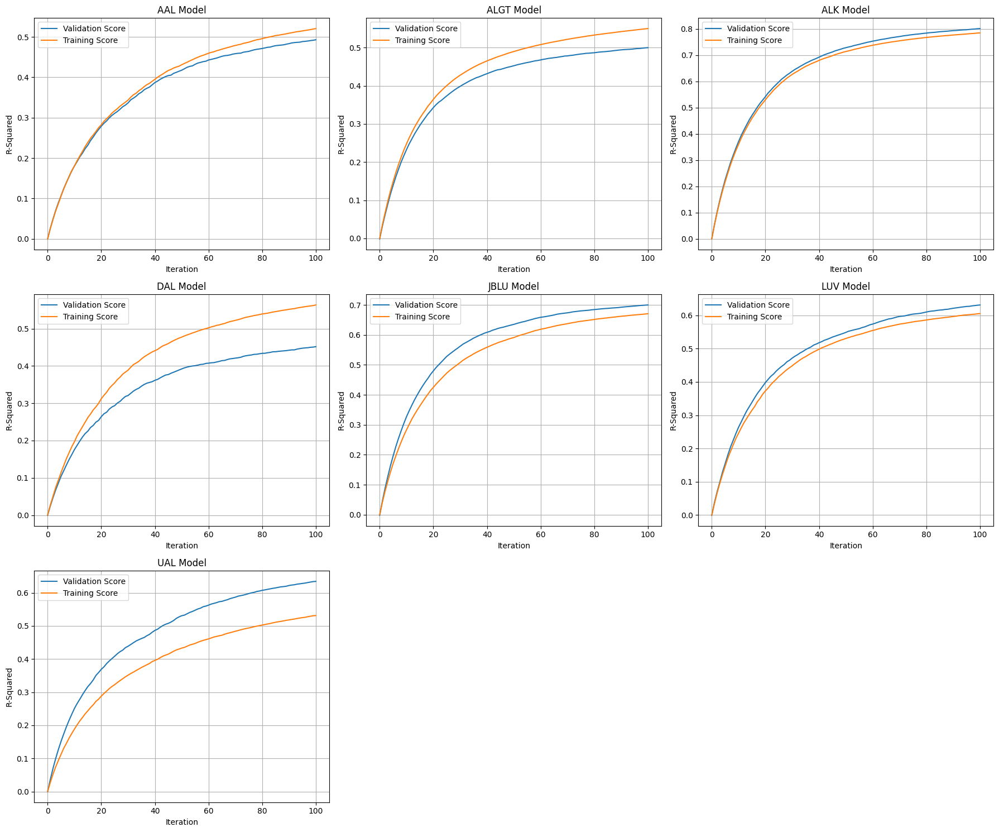

In [31]:
# Graph the training and validation loss for all estimators
fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(18, 15))
axs = axs.flatten()

# Loop through all estimators
for i, estimator in enumerate(multi_model.estimators_):
    if i < len(axs):  # Ensure we don't exceed the number of subplots
        ax = axs[i]
        ax.plot(estimator.validation_score_, label='Validation Score')
        ax.plot(estimator.train_score_, label='Training Score')
        ax.set_title(f'{tickers[i]} Model')
        ax.grid(True)
        ax.set_xlabel('Iteration')
        ax.set_ylabel('R-Squared')
        ax.legend()

# Hide any unused subplots
for j in range(i+1, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()

In [32]:
# random sample of x_val
x_sample = x_val[np.random.choice(x_val.shape[0], 5000, replace=False)]

explainer = shap.TreeExplainer(multi_model.estimators_[2], x_sample, feature_names=x.columns)
shap_values = explainer(x_sample, check_additivity=False)

100%|===================| 4984/5000 [00:21<00:00]        

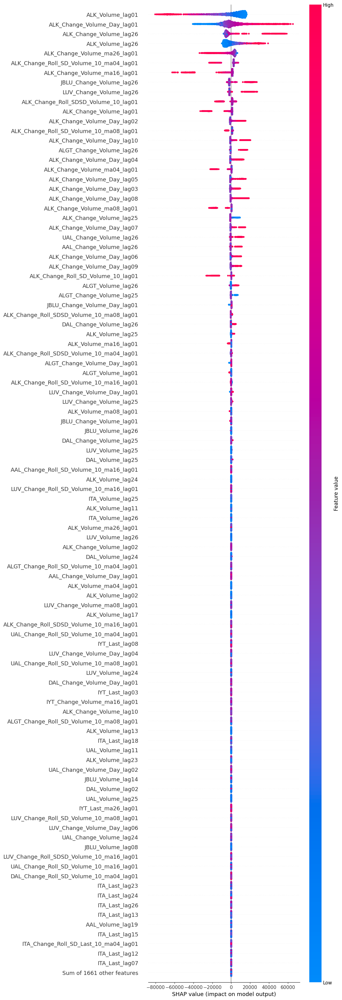

In [38]:
shap.plots.beeswarm(shap_values, max_display=100)

In [34]:
y_pred = multi_model.estimators_[0].predict(x_val)
plot_data = y_val.iloc[:, 0].to_frame()
plot_data['Time'] = plot_data.index
plot_data.reset_index(drop=True, inplace=True)

In [35]:
plot_data = pd.merge(plot_data, pd.DataFrame(y_pred, columns=['y_pred']), left_index=True, right_index=True)

In [36]:
plot_data

,AAL_Change_Volume,Time,y_pred
0,-456970,2023-03-09 10:15:00,-355468.344801
1,266464,2023-03-09 10:30:00,206205.526358
2,-81460,2023-03-09 10:45:00,-122485.058171
3,-169470,2023-03-09 11:00:00,-174902.173707
4,217206,2023-03-09 11:15:00,160737.284768
...,...,...,...
9646,20644,2024-08-30 12:00:00,26480.983179
9647,-135665,2024-08-30 12:15:00,-87367.633498
9648,-67197,2024-08-30 12:30:00,-111110.581095
9649,203152,2024-08-30 12:45:00,104353.155307


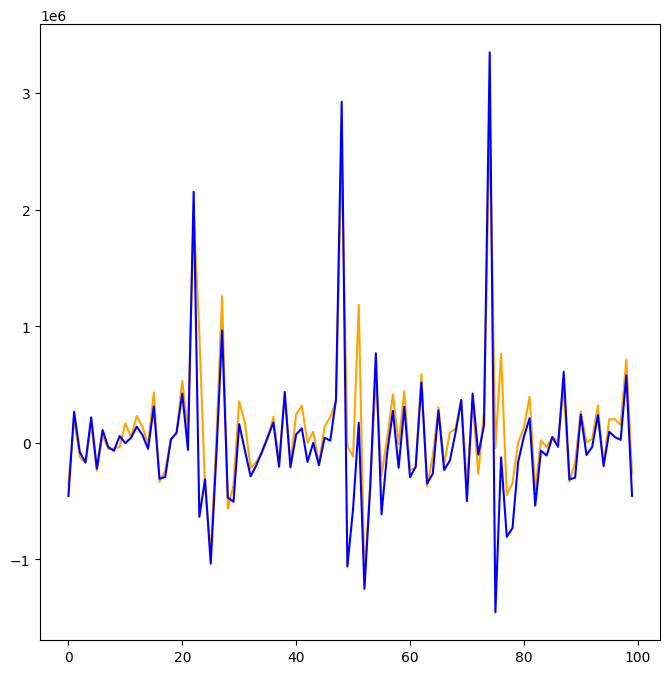

In [37]:
filter_data = plot_data.iloc[:100,:]

plt.figure(figsize=(8, 8))
plt.plot(filter_data.index, filter_data['y_pred'], label='Predicted', color='orange')
plt.plot(filter_data.index, filter_data['AAL_Change_Volume'], label='True', color='blue')